In [1]:
import torch
import sklearn

torch.cuda.is_available()

True

In [1]:
import pandas as pd     
import plotly           
import plotly.express as px

data = px.data.gapminder()
df = data.query("continent == 'Oceania'")

fig = px.bar(df, x='year', y='pop')
fig.show()

In [3]:
import torch
from torch_geometric.data import Data

edge_index = torch.tensor([[0, 1, 1, 2],
                           [1, 0, 2, 1]], dtype=torch.long)
x = torch.tensor([[-1], [0], [1]], dtype=torch.float)

data = Data(x=x, edge_index=edge_index)
data

Data(x=[3, 1], edge_index=[2, 4])

In [11]:
import pandas as pd
caregiver = pd.read_csv("mimic/icu/caregiver.csv")
icu_stays = pd.read_csv("mimic/icu/icustays.csv")
d_items = pd.read_csv("mimic/icu/d_items.csv")
input_events = pd.read_csv("mimic/icu/inputevents.csv")


In [12]:
icu_stays["subject_id"]

0        10000032
1        10000980
2        10001217
3        10001217
4        10001725
           ...   
73176    19999442
73177    19999625
73178    19999828
73179    19999840
73180    19999987
Name: subject_id, Length: 73181, dtype: int64

In [18]:
d_items

,itemid,label,abbreviation,linksto,category,unitname,param_type,lownormalvalue,highnormalvalue
0,220001,Problem List,Problem List,chartevents,General,NaN,Text,NaN,NaN
1,220003,ICU Admission date,ICU Admission date,datetimeevents,ADT,NaN,Date and time,NaN,NaN
2,220045,Heart Rate,HR,chartevents,Routine Vital Signs,bpm,Numeric,NaN,NaN
3,220046,Heart rate Alarm - High,HR Alarm - High,chartevents,Alarms,bpm,Numeric,NaN,NaN
4,220047,Heart Rate Alarm - Low,HR Alarm - Low,chartevents,Alarms,bpm,Numeric,NaN,NaN
...,...,...,...,...,...,...,...,...,...
4009,230077,Documented on DC Summary (PICC),Documented on DC Summary (PICC),chartevents,PICC Line Insertion,NaN,Text,NaN,NaN
4010,230078,Documented on DC Summary (Thora),Documented on DC Summary (Thora),chartevents,Thoracentesis,NaN,Text,NaN,NaN
4011,230083,Replacement Fluid (Pre-Filter),Replacement Fluid (Pre-Filter),chartevents,Dialysis,NaN,Text,NaN,NaN
4012,230084,Replacement Fluid (Post-Filter),Replacement Fluid (Post-Filter),chartevents,Dialysis,NaN,Text,NaN,NaN


In [13]:
input_events.columns

Index(['subject_id', 'hadm_id', 'stay_id', 'caregiver_id', 'starttime',
       'endtime', 'storetime', 'itemid', 'amount', 'amountuom', 'rate',
       'rateuom', 'orderid', 'linkorderid', 'ordercategoryname',
       'secondaryordercategoryname', 'ordercomponenttypedescription',
       'ordercategorydescription', 'patientweight', 'totalamount',
       'totalamountuom', 'isopenbag', 'continueinnextdept',
       'statusdescription', 'originalamount', 'originalrate'],
      dtype='object')

In [46]:
procedure_events = pd.read_csv("mimic/icu/procedureevents.csv")


In [15]:
procedure_events.columns

Index(['subject_id', 'hadm_id', 'stay_id', 'caregiver_id', 'starttime',
       'endtime', 'storetime', 'itemid', 'value', 'valueuom', 'location',
       'locationcategory', 'orderid', 'linkorderid', 'ordercategoryname',
       'ordercategorydescription', 'patientweight', 'isopenbag',
       'continueinnextdept', 'statusdescription', 'originalamount',
       'originalrate'],
      dtype='object')

In [19]:
chart_events = pd.read_csv("mimic/icu/chartevents.csv")


: 

: 

In [64]:
admissions = pd.read_csv("mimic/hosp/admissions.csv")
patients = pd.read_csv("mimic/hosp/patients.csv")

In [8]:
admissions.describe()

,subject_id,hadm_id,hospital_expire_flag
count,4.312310e+05,4.312310e+05,431231.000000
mean,1.500766e+07,2.500314e+07,0.019964
std,2.877498e+06,2.888180e+06,0.139876
min,1.000003e+07,2.000002e+07,0.000000
25%,1.251557e+07,2.250155e+07,0.000000
50%,1.501288e+07,2.500669e+07,0.000000
75%,1.749622e+07,2.750470e+07,0.000000
max,1.999999e+07,2.999993e+07,1.000000


In [71]:
admissions[(~admissions["deathtime"].isna() &
        admissions["subject_id"].isin(icu_stays["subject_id"].values.tolist()))]

,subject_id,hadm_id,admittime,dischtime,deathtime,admission_type,admit_provider_id,admission_location,discharge_location,insurance,language,marital_status,race,edregtime,edouttime,hospital_expire_flag
73,10001884,26184834,2131-01-07 20:39:00,2131-01-20 05:15:00,2131-01-20 05:15:00,OBSERVATION ADMIT,P874LG,EMERGENCY ROOM,DIED,Medicare,ENGLISH,MARRIED,BLACK/AFRICAN AMERICAN,2131-01-07 13:36:00,2131-01-07 22:13:00,1
102,10002155,20345487,2131-03-09 20:33:00,2131-03-10 01:55:00,2131-03-10 21:53:00,EW EMER.,P80515,EMERGENCY ROOM,DIED,Other,ENGLISH,MARRIED,WHITE,2131-03-09 19:14:00,2131-03-09 21:33:00,1
195,10003400,23559586,2137-08-04 00:07:00,2137-09-02 17:05:00,2137-09-02 17:05:00,URGENT,P99U21,TRANSFER FROM HOSPITAL,DIED,Medicare,ENGLISH,MARRIED,BLACK/AFRICAN AMERICAN,NaN,NaN,1
232,10004401,25777141,2144-06-05 19:45:00,2144-06-18 21:30:00,2144-06-18 21:30:00,EW EMER.,P38TI6,EMERGENCY ROOM,DIED,Medicare,ENGLISH,MARRIED,WHITE,2144-06-05 16:08:00,2144-06-05 20:36:00,1
256,10004720,22081550,2186-11-12 18:01:00,2186-11-17 18:30:00,2186-11-17 18:30:00,EW EMER.,P3529J,INFORMATION NOT AVAILABLE,DIED,Medicare,ENGLISH,SINGLE,WHITE,2186-11-12 16:09:00,2186-11-12 19:55:00,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
430933,19992885,20352341,2152-07-17 08:03:00,2152-07-24 02:56:00,2152-07-24 22:45:00,EW EMER.,P01T18,EMERGENCY ROOM,DIED,Medicare,ENGLISH,MARRIED,WHITE,2152-07-17 05:57:00,2152-07-17 08:21:00,1
430995,19994505,20026892,2185-11-13 17:22:00,2185-11-17 22:45:00,2185-11-17 00:00:00,EU OBSERVATION,P95N5L,EMERGENCY ROOM,NaN,Other,?,MARRIED,WHITE,2185-11-13 11:12:00,2185-11-13 22:00:00,1
431039,19995127,27369164,2138-06-06 18:00:00,2138-06-12 01:48:00,2138-06-12 01:48:00,EW EMER.,P52TGZ,EMERGENCY ROOM,DIED,Medicare,ENGLISH,MARRIED,BLACK/AFRICAN AMERICAN,2138-06-06 13:56:00,2138-06-06 19:40:00,1
431193,19999297,21439025,2162-08-14 23:55:00,2162-08-23 04:16:00,2162-08-23 04:16:00,OBSERVATION ADMIT,P55YAK,EMERGENCY ROOM,DIED,Other,ENGLISH,SINGLE,MULTIPLE RACE/ETHNICITY,2162-08-14 18:26:00,2162-08-15 02:01:00,1


In [65]:
patients[patients["subject_id"].isin(icu_stays["subject_id"].values.tolist())]

,subject_id,gender,anchor_age,anchor_year,anchor_year_group,dod
0,10000032,F,52,2180,2014 - 2016,2180-09-09
33,10000980,F,73,2186,2008 - 2010,2193-08-26
40,10001217,F,55,2157,2011 - 2013,NaN
53,10001725,F,46,2110,2011 - 2013,NaN
61,10001884,F,68,2122,2008 - 2010,2131-01-20
...,...,...,...,...,...,...
299696,19999442,M,41,2146,2008 - 2010,NaN
299700,19999625,M,81,2138,2008 - 2010,NaN
299707,19999828,F,46,2147,2017 - 2019,NaN
299709,19999840,M,58,2164,2008 - 2010,2164-09-17


In [25]:
dead = patients.dropna()
icu_dead = dead[dead["subject_id"].isin(icu_stays["subject_id"].values.tolist())]

In [28]:
icu_dead["gender"].value_counts()

gender
M    8921
F    7556
Name: count, dtype: int64

In [27]:
icu_dead.describe()

,subject_id,anchor_age,anchor_year
count,1.647700e+04,16477.000000,16477.000000
mean,1.498708e+07,70.417612,2151.721126
std,2.894614e+06,14.730309,23.563443
min,1.000003e+07,18.000000,2110.000000
25%,1.246624e+07,61.000000,2132.000000
50%,1.498423e+07,72.000000,2152.000000
75%,1.751327e+07,82.000000,2172.000000
max,1.999984e+07,91.000000,2206.000000


In [30]:
icu_dead["anchor_year_group"].value_counts()

anchor_year_group
2008 - 2010    6460
2011 - 2013    3968
2014 - 2016    3422
2017 - 2019    2627
Name: count, dtype: int64

In [29]:
icu_dead.head()

,subject_id,gender,anchor_age,anchor_year,anchor_year_group,dod
0,10000032,F,52,2180,2014 - 2016,2180-09-09
33,10000980,F,73,2186,2008 - 2010,2193-08-26
61,10001884,F,68,2122,2008 - 2010,2131-01-20
68,10002155,F,80,2128,2008 - 2010,2131-03-10
77,10002430,M,86,2125,2014 - 2016,2130-01-11


In [31]:
icu_dead_ids = icu_dead["subject_id"].values.tolist()

In [ ]:
icu_dead_ids

In [32]:
services = pd.read_csv("mimic/hosp/services.csv")

|Service|	Description|
|-------|--------------|
|CMED	| Cardiac Medical - for non-surgical cardiac related admissions|
|CSURG	| Cardiac Surgery - for surgical cardiac admissions|
|DENT	| Dental - for dental/jaw related admissions|
|ENT	| Ear, nose, and throat - conditions primarily affecting these areas|
|EYE	| Eye diseases - including subspecialty services in glaucoma, cataract surgery, cornea and external |diseases, and neuro-ophthalmology.
|GU	| Genitourinary - reproductive organs/urinary system|
|GYN	| Gynecological - female reproductive systems and breasts|
|MED	| Medical - general service for internal medicine|
|NB	| Newborn - infants born at the hospital|
|NBB	| Newborn baby - infants born at the hospital|
|NMED	| Neurologic Medical - non-surgical, relating to the brain|
|NSURG	| Neurologic Surgical - surgical, relating to the brain|
|OBS	| Obstetrics - conerned with childbirth and the care of women giving birth|
|ORTHO	| Orthopaedic - surgical, relating to the musculoskeletal system|
|OMED	| Orthopaedic medicine - non-surgical, relating to musculoskeletal system|
|PSURG	| Plastic - restortation/reconstruction of the human body (including cosmetic or aesthetic)|
|PSYCH	| Psychiatric - mental disorders relating to mood, behaviour, cognition, or perceptions|
|SURG	| Surgical - general surgical service not classified elsewhere|
|TRAUM	| Trauma - injury or damage caused by physical harm from an external source|
|TSURG	| Thoracic Surgical - surgery on the thorax, located between the neck and the abdomen|
|VSURG	| Vascular Surgical - surgery relating to the circulatory system|

In [39]:
test = services[services["subject_id"].isin(icu_dead_ids[:1])]
test

,subject_id,hadm_id,transfertime,prev_service,curr_service
0,10000032,22595853,2180-05-06 22:24:57,NaN,MED
1,10000032,22841357,2180-06-26 18:28:08,NaN,MED
2,10000032,25742920,2180-08-05 23:44:50,NaN,MED
3,10000032,29079034,2180-07-23 12:36:04,NaN,MED


In [62]:
test = procedure_events[procedure_events["subject_id"]==10000032]
print(test.columns)
test

Index(['subject_id', 'hadm_id', 'stay_id', 'caregiver_id', 'starttime',
       'endtime', 'storetime', 'itemid', 'value', 'valueuom', 'location',
       'locationcategory', 'orderid', 'linkorderid', 'ordercategoryname',
       'ordercategorydescription', 'patientweight', 'isopenbag',
       'continueinnextdept', 'statusdescription', 'originalamount',
       'originalrate'],
      dtype='object')


,subject_id,hadm_id,stay_id,caregiver_id,starttime,endtime,storetime,itemid,value,valueuom,...,orderid,linkorderid,ordercategoryname,ordercategorydescription,patientweight,isopenbag,continueinnextdept,statusdescription,originalamount,originalrate
0,10000032,29079034,39553978,88981.0,2180-07-23 14:43:00,2180-07-23 14:44:00,2180-07-23 14:43:00,225966,1.0,NaN,...,6416557,6416557,Procedures,Task,39.4,0,0,FinishedRunning,1.0,0
1,10000032,29079034,39553978,NaN,2180-07-23 14:24:00,2180-07-23 23:50:00,2180-07-23 23:50:49.983,224275,566.0,min,...,6497934,6497934,Peripheral Lines,ContinuousProcess,39.4,1,0,FinishedRunning,566.0,1
2,10000032,29079034,39553978,NaN,2180-07-23 14:24:00,2180-07-23 23:50:00,2180-07-23 23:50:49.983,224277,566.0,min,...,9643097,9643097,Peripheral Lines,ContinuousProcess,39.4,1,0,FinishedRunning,566.0,1


In [54]:
import plotly.express as px
px.line(test, x="starttime", y="value")

In [56]:
icu_dead[["subject_id", "dod"]]

,subject_id,dod
0,10000032,2180-09-09
33,10000980,2193-08-26
61,10001884,2131-01-20
68,10002155,2131-03-10
77,10002430,2130-01-11
...,...,...
299676,19998843,2187-02-08
299677,19998878,2133-01-03
299689,19999287,2197-09-02
299690,19999297,2162-08-23


In [57]:
output_events = pd.read_csv("mimic/icu/outputevents.csv")

In [59]:
output_events[output_events["subject_id"]==10000032]

,subject_id,hadm_id,stay_id,caregiver_id,charttime,storetime,itemid,value,valueuom
0,10000032,29079034,39553978,88981,2180-07-23 15:00:00,2180-07-23 16:00:00,226560,175.0,ml


In [74]:
emar_events = pd.read_csv("mimic/hosp/emar.csv")
emar_events[emar_events["subject_id"] == 10000032].sort_values(by='emar_id', ascending=False)

,subject_id,hadm_id,emar_id,emar_seq,poe_id,pharmacy_id,enter_provider_id,charttime,medication,event_txt,scheduletime,storetime
90,10000032,25742920.0,10000032-99,99,10000032-217,NaN,P25XWF,2180-08-05 22:36:00,Morphine Sulfate,Administered,2180-08-05 22:36:00,2180-08-05 22:36:00
137,10000032,29079034.0,10000032-98,98,10000032-179,47678769.0,NaN,2180-07-25 17:13:00,Calcium Carbonate,Administered,2180-07-25 17:12:00,2180-07-25 17:13:00
136,10000032,29079034.0,10000032-97,97,10000032-210,49109828.0,NaN,2180-07-25 17:09:00,Albuterol Inhaler,Administered,2180-07-25 17:09:00,2180-07-25 17:10:00
135,10000032,29079034.0,10000032-96,96,10000032-188,NaN,NaN,2180-07-25 16:00:00,Sodium Chloride 0.9% Flush,Not Flushed,2180-07-25 16:00:00,2180-07-25 15:30:00
134,10000032,29079034.0,10000032-95,95,10000032-177,NaN,NaN,2180-07-25 16:00:00,Lactulose,Not Given,2180-07-25 16:00:00,2180-07-25 15:30:00
...,...,...,...,...,...,...,...,...,...,...,...,...
44,10000032,25742920.0,10000032-103,103,10000032-233,77528823.0,NaN,2180-08-06 06:01:00,Sodium Chloride 0.9% Flush,Flushed,2180-08-06 06:01:00,2180-08-06 06:02:00
43,10000032,25742920.0,10000032-102,102,10000032-219,NaN,P25XWF,2180-08-05 22:57:00,Ondansetron,Administered,2180-08-05 22:57:00,2180-08-05 22:59:00
42,10000032,25742920.0,10000032-101,101,10000032-220,NaN,P25XWF,2180-08-05 22:57:00,Donnatal,Administered,2180-08-05 22:57:00,2180-08-05 22:59:00
41,10000032,25742920.0,10000032-100,100,10000032-218,NaN,P25XWF,2180-08-05 22:57:00,Aluminum-Magnesium Hydrox.-Simethicone,Administered,2180-08-05 22:57:00,2180-08-05 22:59:00


In [5]:
hcpc_events = pd.read_csv("mimic/hosp/hcpcsevents.csv")
hcpc_events[hcpc_events["subject_id"] == 10000032]

,subject_id,hadm_id,chartdate,hcpcs_cd,seq_num,short_description


In [1]:
feature_map = {
    "ABGA": ["pH", "PCO2", "PO2", "HCO3-(Bicarbonate)", "Na+", "K+", "Hb", "Clucose"],
    "Vital Sign": ["GCS(Glasgow Coma Scale)", "MBP[(Systolic BP+2*Diastolic BP)/3]",
                   "HR(Heart Rate)", "RR(Respiratory Rate)", "Temperature", "SpO2(O2 saturation pulseoxymetry)"],
    "Lab": ["WBC(White Blood Cell)", "Albumin", "Bilirubin", "Platelet"],
    "Etc": ["Urine output", "FiO2(Fraction inspired Oxygen)"],
    "Demographic": ["Age", "Sex", "BMI[Weight/(Height)^2]"],
    "Image": ["Chest X-ray"]
}

In [4]:
omr_events = pd.read_csv("mimic/hosp/omr.csv")
omr_events[omr_events["subject_id"] == 10000032]

,subject_id,chartdate,seq_num,result_name,result_value
0,10000032,2180-04-27,1,Blood Pressure,110/65
1,10000032,2180-04-27,1,Weight (Lbs),94
2,10000032,2180-05-07,1,BMI (kg/m2),18.0
3,10000032,2180-05-07,1,Height (Inches),60
4,10000032,2180-05-07,1,Weight (Lbs),92.15
5,10000032,2180-05-07,2,Weight (Lbs),92.15
6,10000032,2180-05-07,3,Weight (Lbs),92.15
7,10000032,2180-05-07,4,Weight (Lbs),92.15
8,10000032,2180-05-07,5,Weight (Lbs),92.15
9,10000032,2180-05-07,6,Weight (Lbs),92.15


In [7]:
dlab_events = pd.read_csv("mimic/hosp/d_labitems.csv")
dlab_events#[dlab_events["subject_id"] == 10000032]

,itemid,label,fluid,category
0,50801,Alveolar-arterial Gradient,Blood,Blood Gas
1,50802,Base Excess,Blood,Blood Gas
2,50803,"Calculated Bicarbonate, Whole Blood",Blood,Blood Gas
3,50804,Calculated Total CO2,Blood,Blood Gas
4,50805,Carboxyhemoglobin,Blood,Blood Gas
...,...,...,...,...
1617,53150,Anti Hbs,Blood,Chemistry
1618,53151,Anti-la,Blood,Chemistry
1619,53152,HIV FINAL,Blood,Chemistry
1620,53153,HIV Screen,Blood,Chemistry


In [65]:
chart_events = pd.read_csv("mimic/icu/chartevents.csv", chunksize=1000000)


In [66]:
d_items = pd.read_csv("mimic/icu/d_items.csv", )


name  label        Itemid
[pH] PH(Arterial) : 223830
[pO2] Arterial O2 Pressure : 220224
[pCO2] Arterial CO2 Pressure : 220235
[HCO3] ZHCO3(serum) : 224826
[Glucose] Glucose(serum) : 220621
[K] ZPotassium(serum) : 220640
[Na+] Sodium(serum) : 220645
[Lactate] Lactic Acid(Lactate) : 225668
[Hct] Hematocrit(serum) : 220545

[SpO2] O2 saturation pulseoxymetry : 220277
[RR] Respiratory Rate : 22021
[GCS] GCS-Eye opening : 220739
      GCS-Verbal Response : 223900
      GCS-Motor Response : 223901
[HR] Heart Rate : 220045
[Temperature] Temperature Celsius : 223762
[MBP] ART BP Systolic	: 225309
      ART BP Diastolic : 225310
[WBC] WBC : 220546
[Albumin] ZAlbumin : 220574
[Total Bilirunbin] Total Bilirubin : 225690
[PLT] Platelets : 225170
[BUN] BUN : 225624
[Cr] Creatinine : 220615

[UO] Foley : 226559
[FiO2] Inspired O2 Fraction : 223835

In [71]:
# ABGA(Arterial 붙은거) : PH PO2 PCO2 HCO3 Glucose Potassium(K) Sodium(Na) Lactic Acid(Lactate) Hematocrit(Hct)
# Vital Sign : SpO2 Respiratory Rate GCS(Eye+Verbal+Motor) Heart Rate
# Lab : WBC Albumin [total]Bilirubin Platelet Count BUN Cr
# Etc : Urine Output(outputevents) FiO2
col_name = "Motor"
d_items[(
    d_items["label"].str.contains(col_name) |
    d_items["abbreviation"].str.contains(col_name)
    )]

,itemid,label,abbreviation,linksto,category,unitname,param_type,lownormalvalue,highnormalvalue
408,223901,GCS - Motor Response,Motor Response,chartevents,Neurological,NaN,Text,NaN,NaN
1967,226757,GCSMotorApacheIIValue,GCSMotorApacheIIValue,chartevents,Scores - APACHE II,NaN,Text,NaN,NaN
2055,227012,GCSMotor_ApacheIV,GCSMotor_ApacheIV,chartevents,Scores - APACHE IV (2),NaN,Text,NaN,NaN
2127,227120,Motor Deficit,Motor Deficit,chartevents,Pain/Sedation,NaN,Text,NaN,NaN
2898,228404,Motor L Arm,Motor L Arm,chartevents,Neurological,NaN,Text,NaN,NaN
2899,228405,Motor L Leg,Motor L Leg,chartevents,Neurological,NaN,Text,NaN,NaN
2900,228406,Motor R Arm,Motor R Arm,chartevents,Neurological,NaN,Text,NaN,NaN
2901,228407,Motor R Leg,Motor R Leg,chartevents,Neurological,NaN,Text,NaN,NaN
3528,229311,Motor Current (mA) High,Motor Current (mA) High,chartevents,Impella,NaN,Numeric,NaN,NaN
3529,229312,Motor Current (mA) Low,Motor Current (mA) Low,chartevents,Impella,NaN,Numeric,NaN,NaN


In [72]:
for df in chart_events:
    display(df[df["itemid"]==223901])
    break

,subject_id,hadm_id,stay_id,caregiver_id,charttime,storetime,itemid,value,valuenum,valueuom,warning
1000084,10027602,28166872,32391858,19347.0,2201-11-09 00:08:00,2201-11-09 00:11:00,223901,Flex-withdraws,4.0,NaN,0.0
1000303,10027602,28166872,32391858,19347.0,2201-11-09 02:00:00,2201-11-09 03:52:00,223901,Obeys Commands,6.0,NaN,0.0
1000464,10027602,28166872,32391858,19347.0,2201-11-09 04:00:00,2201-11-09 04:45:00,223901,Obeys Commands,6.0,NaN,0.0
1000592,10027602,28166872,32391858,19347.0,2201-11-09 06:00:00,2201-11-09 06:19:00,223901,Obeys Commands,6.0,NaN,0.0
1000656,10027602,28166872,32391858,19728.0,2201-11-01 19:00:00,2201-11-01 21:34:00,223901,Localizes Pain,5.0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...
1998736,10061303,24889301,31287291,38262.0,2152-08-05 20:00:00,2152-08-05 20:12:00,223901,Obeys Commands,6.0,NaN,0.0
1999346,10061303,24889301,31287291,97715.0,2152-08-05 12:07:00,2152-08-05 12:07:00,223901,No response,1.0,NaN,0.0
1999547,10061303,24889301,31287291,97715.0,2152-08-05 14:20:00,2152-08-05 14:20:00,223901,Obeys Commands,6.0,NaN,0.0
1999578,10061303,24889301,31287291,97715.0,2152-08-05 15:06:00,2152-08-05 15:06:00,223901,Obeys Commands,6.0,NaN,0.0


In [125]:
oc_events = pd.read_csv("mimic/icu/outputevents.csv",)
oc_events[oc_events["itemid"]==220045]

,subject_id,hadm_id,stay_id,caregiver_id,charttime,storetime,itemid,value,valueuom


In [164]:
ip_events = pd.read_csv("mimic/icu/inputevents.csv",)
ip_events[ip_events["itemid"]==220451]

,subject_id,hadm_id,stay_id,caregiver_id,starttime,endtime,storetime,itemid,amount,amountuom,...,ordercomponenttypedescription,ordercategorydescription,patientweight,totalamount,totalamountuom,isopenbag,continueinnextdept,statusdescription,originalamount,originalrate


In [163]:
ig_events = pd.read_csv("mimic/icu/ingredientevents.csv",)
ig_events[ig_events["itemid"]==220451]

,subject_id,hadm_id,stay_id,caregiver_id,starttime,endtime,storetime,itemid,amount,amountuom,rate,rateuom,orderid,linkorderid,statusdescription,originalamount,originalrate


In [1]:
import pandas as pd

item_dict ={
    "pH": 223830,
    "pO2": 220224,
    "pCO2": 220235,
    "HCO3": 227443,
    "Glucose": 220621,
    "K": 227442,
    "Na+": 220645,
    "Lactate": 225668,
    "Hct": 220545,
    "SpO2": 220277,
    "RR": 220210,
    "GCS-eye":220739,
    "GCS-verbal": 223900,
    "GCS-motor": 223901,
    "HR": 220045,
    "Temp": 223761,
   # "MBP-systolic": 220050,
   # "MBP-diastolic": 220051,
    "Mbp" : 220181,
    "BP-mean": 220181,
    "WBC": 220546,
    "Albumin": 227456,
    "Bilirubin": 225690,
    "PLT": 227457,
    "BUN": 225624,
    "Cr": 220615,
    "HR signal": 220048,    
    "UO-Foley": 226559,
    "UO-Void": 226560,
    "FiO2": 223835,
    "Height": 226730,
    "Weight": 226512,
    "Gender": 226228
}

In [2]:
def search_item_dict(item):
    if isinstance(item, dict):
        return [search_item_dict(v) for k, v in item.items()]
    else: 
        return item

def resize_list(_list):
    temp = []
    for i in _list:
        temp += i if isinstance(i, list) else [i]
    return temp

item_ids = [search_item_dict(v) for k, v in item_dict.items()]
item_ids = resize_list(item_ids)


In [3]:
chart_events = pd.read_csv("mimic/icu/chartevents.csv", chunksize=1000000)


In [4]:
chunk_list = []
for chunk in chart_events:
    chunk_list += [chunk[chunk["itemid"].isin(item_ids)]]

In [5]:
chart_item = []
for data in chunk_list:
    for sub in data["subject_id"].unique():
        for _id in item_ids:
            item_data = data[(data["subject_id"]==sub) & (data["itemid"]==_id)]
            if len(item_data) > 0:
                chart_item += [item_data.sort_values(by="charttime").iloc[:1, :]]

In [6]:
chart_item[1]

,subject_id,hadm_id,stay_id,caregiver_id,charttime,storetime,itemid,value,valuenum,valueuom,warning
468,10000032,29079034,39553978,NaN,2180-07-23 21:45:00,2180-07-23 22:30:00,220621,115,115.0,mg/dL,1.0


In [7]:
uo_void = pd.read_csv("/home/kevin/mimic/oe226560.csv").drop(columns=["Unnamed: 0"])
uo_void["valuenum"] = uo_void["value"]
uo_void["warning"] = 1.0
uo_foley = pd.read_csv("/home/kevin/mimic/oe226559.csv").drop(columns=["Unnamed: 0"])
uo_foley["valuenum"] = uo_foley["value"]
uo_foley["warning"] = 1.0
hr  = pd.read_csv("/home/kevin/mimic/ce220048.csv").drop(columns=["Unnamed: 0"])
hr["valuenum"] = hr["value"]
hr["warning"] = 1.0

In [8]:
all_items = pd.concat(chart_item, axis=0, ignore_index=True)
all_items = pd.concat([all_items, uo_foley, uo_void, hr], axis=0, ignore_index=True)

In [9]:
time_interval = pd.read_excel("/home/kevin/mimic/patient_add_admission_time_interval.xlsx").drop(columns=["Unnamed: 0"])

In [10]:
keys = ["subject_id"] + list(item_dict.keys()) + ["time_interval", "dod"]
subs = all_items["subject_id"].unique()
values = [subs] + [[None]*len(subs)] * len(item_dict.keys()) + [[None]*len(subs)] * 2

to_df_form = pd.DataFrame(dict(zip(keys, values)))

In [11]:
from tqdm.auto import tqdm

v_2_k = {v:k for k,v in item_dict.items()}

for index, item in tqdm(all_items.iterrows()):
    to_df_form.loc[to_df_form["subject_id"]==item["subject_id"], v_2_k[item["itemid"]]] = item["valuenum"]
    if to_df_form.loc[to_df_form["subject_id"]==item["subject_id"], "dod"].item() is None:
        label = time_interval[time_interval["subject_id"]==item["subject_id"]].sort_values(by="admittime").iloc[:1,:]
        to_df_form.loc[to_df_form["subject_id"]==item["subject_id"], "dod"] = label["dod"].item()
        to_df_form.loc[to_df_form["subject_id"]==item["subject_id"], "time_interval"] = label["time_interval"].item()
        to_df_form.loc[to_df_form["subject_id"]==item["subject_id"], "Gender"] = label["gender"].item()
        to_df_form.loc[to_df_form["subject_id"]==item["subject_id"], "Admission"] = label["admittime"].item()
    if not to_df_form.loc[to_df_form["subject_id"]==item["subject_id"], "UO-Void"].item() is None and\
       not to_df_form.loc[to_df_form["subject_id"]==item["subject_id"], "UO-Foley"].item() is None :
       void = to_df_form.loc[to_df_form["subject_id"]==item["subject_id"], "UO-Void"].item()
       foley = to_df_form.loc[to_df_form["subject_id"]==item["subject_id"], "UO-Foley"].item()
       to_df_form.loc[to_df_form["subject_id"]==item["subject_id"], "UO"] = void if void > foley else foley


In [12]:
to_df_form[["UO-Foley", "UO-Void"]] = to_df_form[["UO-Foley", "UO-Void"]].fillna(0)
to_df_form.loc[to_df_form["UO-Void"] < 0, "UO-Void"] = 0
for index, row in to_df_form.iterrows():
    if not to_df_form.loc[index,'Weight'] is None and not to_df_form.loc[index,'Height'] is None:
        if to_df_form.loc[index, "Height"] != 0:
            to_df_form.loc[index,"BMI"] = to_df_form.loc[index, "Weight"]/((to_df_form.loc[index, "Height"]/100)**2)
   # if not to_df_form.loc[index,'MBP-systolic'] is None and not to_df_form.loc[index,'MBP-diastolic'] is None:
   #     to_df_form.loc[index, "Mean BP"] = (to_df_form.loc[index, "MBP-systolic"] + to_df_form.loc[index,"MBP-diastolic"]*2)/3
    if not to_df_form.loc[index,'GCS-eye'] is None and not to_df_form.loc[index,'GCS-verbal'] is None and not to_df_form.loc[index,'GCS-motor'] is None:
        to_df_form.loc[index, "GCS score"] = to_df_form.loc[index, "GCS-eye"] + to_df_form.loc[index,"GCS-verbal"] + to_df_form.loc[index,"GCS-motor"]


In [13]:
for index, item in to_df_form.iterrows():
    if not item["UO-Void"] is None and not item["UO-Foley"] is None :
       void = item["UO-Void"]
       foley = item["UO-Foley"]
       to_df_form.loc[index, "UO"] = void if void > foley else foley

In [14]:
to_df_form["UO"].describe()

count    50920.000000
mean       223.327396
std        217.506459
min          0.000000
25%         60.000000
50%        160.000000
75%        300.000000
max       3515.000000
Name: UO, dtype: float64

In [15]:
item_dict.keys()

dict_keys(['pH', 'pO2', 'pCO2', 'HCO3', 'Glucose', 'K', 'Na+', 'Lactate', 'Hct', 'SpO2', 'RR', 'GCS-eye', 'GCS-verbal', 'GCS-motor', 'HR', 'Temp', 'Mbp', 'BP-mean', 'WBC', 'Albumin', 'Bilirubin', 'PLT', 'BUN', 'Cr', 'HR signal', 'UO-Foley', 'UO-Void', 'FiO2', 'Height', 'Weight', 'Gender'])

In [16]:
from sklearn.preprocessing import LabelEncoder
to_df_form.loc[(to_df_form["Gender"]=="F") & (to_df_form["BMI"].isna()), "BMI"] = to_df_form.loc[to_df_form["Gender"]=="F", "BMI"].median()
to_df_form.loc[(to_df_form["Gender"]=="M") & (to_df_form["BMI"].isna()), "BMI"] = to_df_form.loc[to_df_form["Gender"]=="M", "BMI"].median()
to_df_form.loc[(to_df_form["Gender"]=="F") & (to_df_form["BMI"].isna()), "Weight"] = to_df_form.loc[to_df_form["Gender"]=="F", "Weight"].median()
to_df_form.loc[(to_df_form["Gender"]=="M") & (to_df_form["BMI"].isna()), "Weight"] = to_df_form.loc[to_df_form["Gender"]=="M", "Weight"].median()
to_df_form.loc[(to_df_form["Gender"]=="F") & (to_df_form["BMI"].isna()), "Height"] = to_df_form.loc[to_df_form["Gender"]=="F", "Height"].median()
to_df_form.loc[(to_df_form["Gender"]=="M") & (to_df_form["BMI"].isna()), "Height"] = to_df_form.loc[to_df_form["Gender"]=="M", "Height"].median()
numerics = [c for c in to_df_form.columns if not c in ["Mbp", "UO-Foley", "UO-Void", 
                                                       "GCS-eye", "GCS-verbal", "GCS-motor",
                                                       "Gender","time_interval", "dod", 
                                                       "Admission"]]
numeric_df = to_df_form[numerics]
numeric_df.loc[numeric_df["FiO2"]>=73.610, "FiO2"] = 50 # numeric_df["FiO2"].median()
numeric_df.loc[numeric_df["FiO2"].isna(), "FiO2"] = 50 
numeric_df.loc[numeric_df["Bilirubin"]>30, "Bilirubin"] = numeric_df["Bilirubin"].median()
numeric_df.loc[numeric_df["WBC"]>100, "WBC"] = numeric_df["WBC"].median()
numeric_df.loc[numeric_df["Hct"]>60, "Hct"] = 36 # numeric_df["Hct"].median()
numeric_df.loc[numeric_df["Hct"].isna(), "Hct"] = 36
numeric_df.loc[numeric_df["Albumin"]>8, "Albumin"] = 4.0 # numeric_df["Albumin"].median()
numeric_df.loc[numeric_df["Albumin"].isna(), "Albumin"] = 4.0
numeric_df.loc[numeric_df["K"]>8, "K"] = numeric_df["K"].median()
numeric_df.loc[numeric_df["pH"]>14, "pH"] = numeric_df["pH"].median()
numeric_df.loc[numeric_df["pO2"]>250, "pO2"] = 100 # numeric_df["pO2"].median()
numeric_df.loc[numeric_df["pO2"].isna(), "pO2"] = 100
numeric_df.loc[numeric_df["pCO2"]>100, "pCO2"] = numeric_df["pCO2"].median()
numeric_df.loc[numeric_df["HCO3"]>100, "HCO3"] = numeric_df["HCO3"].median()

le = LabelEncoder()
le.fit(numeric_df["HR signal"].unique())
numeric_df.loc[:, "HR signal"] = le.transform(numeric_df["HR signal"])

In [17]:
for i, r in numeric_df.describe().items():
    if r["min"] < 0:
        numeric_df.loc[numeric_df[i]<0, i] = 0

In [18]:
numeric_df = numeric_df.fillna(numeric_df.median())
print(numeric_df.columns)
# numeric_df["Gender"]=to_df_form["Gender"]
# numeric_df["time_interval"] = to_df_form["time_interval"]
# numeric_df["dod"] = to_df_form["dod"]
to_df_form.to_csv("/home/kevin/mimic/icu_data_nan.csv", index=False)
numeric_df.to_csv("/home/kevin/mimic/icu_data.csv", index=False)

Index(['subject_id', 'pH', 'pO2', 'pCO2', 'HCO3', 'Glucose', 'K', 'Na+',
       'Lactate', 'Hct', 'SpO2', 'RR', 'HR', 'Temp', 'BP-mean', 'WBC',
       'Albumin', 'Bilirubin', 'PLT', 'BUN', 'Cr', 'HR signal', 'FiO2',
       'Height', 'Weight', 'UO', 'BMI', 'GCS score'],
      dtype='object')


In [57]:
import pandas as pd
to_df_form = pd.read_csv("/home/kevin/mimic/icu_data_nan.csv",)
numeric_df = pd.read_csv("/home/kevin/mimic/icu_data.csv",).drop(columns=["subject_id", "Weight", "Height"])
dod_counts = to_df_form["dod"].value_counts()[1]
sample_index = to_df_form[to_df_form["dod"]==0].sample(dod_counts).index
dod_index = to_df_form[to_df_form["dod"]==1].index

# numeric_df = pd.concat([numeric_df.loc[sample_index, :], numeric_df.loc[dod_index, :]],)
# to_df_form = to_df_form.loc[numeric_df.index, :]

In [58]:
from sklearn.decomposition import PCA 
from sklearn.preprocessing import MinMaxScaler

scaled = MinMaxScaler().fit_transform(numeric_df)

pca = PCA(n_components=7)
df_pca = pca.fit_transform(scaled)
print(df_pca.shape[1])
pca_data=dict()
for i in range(df_pca.shape[1]):
    pca_data.update({f"Component {i+1}": df_pca[:, i]})
pca_df = pd.DataFrame(pca_data)
pca_df.loc[:, "Mortality"] = to_df_form["dod"]
pca_df.loc[:, "Gender"] = to_df_form["Gender"]
pca_df.loc[:, "Hospital"] = to_df_form["time_interval"]
numeric_df["Mortality"] = to_df_form["dod"]
numeric_df["Hosptial"] = to_df_form["time_interval"]
numeric_df["Gender"] = to_df_form["Gender"]

7


In [84]:
import plotly.express as px

markers = ["*", "s", "o"] 
fig =px.scatter(pca_df,
                x='Component 7',
                y='Component 3',
                color='Mortality')
fig.show()

In [40]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE, ADASYN

for i,v in numeric_df.isna().any().items():
    if v:
        numeric_df = numeric_df.drop(columns=[i])
dataset = numeric_df
dataset["dod"] = to_df_form["dod"]
dataset["time_interval"] = to_df_form["time_interval"]
dataset["Gender"] = to_df_form["Gender"]

train, test = train_test_split(dataset, test_size=0.2)
train = train.reset_index(drop=True)
test = test.reset_index(drop=True)

# oversample = RandomOverSampler(sampling_strategy='minority')
oversample = SMOTE(sampling_strategy=0.4)
train, train_dod = oversample.fit_resample(train.drop(columns=["dod", "Gender"]), train["dod"])
train["dod"] = train_dod

X = train.drop(columns=["dod", "time_interval"]).values.astype(float)
y = train["dod"].values.reshape(-1,1).astype(int)
y_reg = train["time_interval"].values.reshape(-1,1).astype(int)

female_index = test[test["Gender"]=="F"].index
male_index = test[test["Gender"]=="M"].index

X_test = test.drop(columns=["dod", "Gender", "time_interval"]).values.astype(float)
y_test = test["dod"].values.reshape(-1,1).astype(int)
y_reg_test = test["time_interval"].values.reshape(-1,1).astype(int)

In [46]:
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import classification_report, mean_squared_error, r2_score

skf = StratifiedKFold(n_splits=7, shuffle=True, )
for train_idx, val_idx in skf.split(X, y):
    clf = RandomForestClassifier(max_depth=15,)
    reg = RandomForestRegressor(max_depth=15,)
    X_train, y_train, y_reg_train = X[train_idx], y[train_idx], y_reg[train_idx]
    X_val, y_val, y_reg_val = X[val_idx], y[val_idx], y_reg[val_idx]
    clf.fit(X_train, y_train)
    reg.fit(X_train, y_reg_train)
    y_pred = clf.predict(X_val,)
    y_reg_pred = reg.predict(X_val)
    print(classification_report(y_val, y_pred, labels=[0,1]))
    print(mean_squared_error(y_reg_val, y_reg_pred, squared=False), r2_score(y_reg_val, y_reg_pred,))


/tmp/ipykernel_14384/780695904.py:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train, y_train)
/tmp/ipykernel_14384/780695904.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  reg.fit(X_train, y_reg_train)


              precision    recall  f1-score   support

           0       0.78      0.91      0.84      3922
           1       0.72      0.47      0.57      1898

    accuracy                           0.77      5820
   macro avg       0.75      0.69      0.70      5820
weighted avg       0.76      0.77      0.75      5820

0.24845187327394674 0.9992334675388531


/tmp/ipykernel_14384/780695904.py:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train, y_train)
/tmp/ipykernel_14384/780695904.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  reg.fit(X_train, y_reg_train)


              precision    recall  f1-score   support

           0       0.78      0.90      0.83      3922
           1       0.69      0.46      0.55      1898

    accuracy                           0.76      5820
   macro avg       0.73      0.68      0.69      5820
weighted avg       0.75      0.76      0.74      5820

0.07802524043109317 0.9999237831899261


/tmp/ipykernel_14384/780695904.py:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train, y_train)
/tmp/ipykernel_14384/780695904.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  reg.fit(X_train, y_reg_train)


              precision    recall  f1-score   support

           0       0.78      0.91      0.84      3922
           1       0.71      0.47      0.57      1898

    accuracy                           0.76      5820
   macro avg       0.74      0.69      0.70      5820
weighted avg       0.76      0.76      0.75      5820

0.37463526363119326 0.9982834889867301


/tmp/ipykernel_14384/780695904.py:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train, y_train)
/tmp/ipykernel_14384/780695904.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  reg.fit(X_train, y_reg_train)


              precision    recall  f1-score   support

           0       0.78      0.91      0.84      3921
           1       0.71      0.45      0.55      1898

    accuracy                           0.76      5819
   macro avg       0.74      0.68      0.70      5819
weighted avg       0.75      0.76      0.75      5819

0.11370277488855295 0.9998405522685486


/tmp/ipykernel_14384/780695904.py:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train, y_train)
/tmp/ipykernel_14384/780695904.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  reg.fit(X_train, y_reg_train)


              precision    recall  f1-score   support

           0       0.78      0.90      0.84      3921
           1       0.70      0.49      0.58      1898

    accuracy                           0.77      5819
   macro avg       0.74      0.69      0.71      5819
weighted avg       0.76      0.77      0.75      5819

0.08626324426158836 0.9999102053428743


/tmp/ipykernel_14384/780695904.py:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train, y_train)
/tmp/ipykernel_14384/780695904.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  reg.fit(X_train, y_reg_train)


              precision    recall  f1-score   support

           0       0.78      0.90      0.84      3921
           1       0.70      0.47      0.56      1898

    accuracy                           0.76      5819
   macro avg       0.74      0.69      0.70      5819
weighted avg       0.75      0.76      0.75      5819

1.6346672863200982 0.9718143060074154


/tmp/ipykernel_14384/780695904.py:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train, y_train)
/tmp/ipykernel_14384/780695904.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  reg.fit(X_train, y_reg_train)


              precision    recall  f1-score   support

           0       0.78      0.90      0.84      3921
           1       0.70      0.47      0.56      1898

    accuracy                           0.76      5819
   macro avg       0.74      0.69      0.70      5819
weighted avg       0.75      0.76      0.75      5819

0.0864997886629509 0.9999090821138424


In [39]:
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report

skf = StratifiedKFold(n_splits=7, shuffle=True, )
for train_idx, val_idx in skf.split(X, y):
    clf = GradientBoostingClassifier()
    X_train, y_train = X[train_idx], y[train_idx]
    X_val, y_val = X[val_idx], y[val_idx]
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_val,)
    print(classification_report(y_val, y_pred, labels=[0,1]))


              precision    recall  f1-score   support

           0       0.80      0.87      0.83      4920
           1       0.84      0.76      0.80      4429

    accuracy                           0.82      9349
   macro avg       0.82      0.81      0.81      9349
weighted avg       0.82      0.82      0.81      9349

              precision    recall  f1-score   support

           0       0.81      0.87      0.84      4920
           1       0.84      0.77      0.81      4429

    accuracy                           0.82      9349
   macro avg       0.83      0.82      0.82      9349
weighted avg       0.82      0.82      0.82      9349

              precision    recall  f1-score   support

           0       0.80      0.87      0.83      4921
           1       0.84      0.77      0.80      4428

    accuracy                           0.82      9349
   macro avg       0.82      0.82      0.82      9349
weighted avg       0.82      0.82      0.82      9349

              preci

In [40]:
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import classification_report

skf = StratifiedKFold(n_splits=7, shuffle=True, )
for train_idx, val_idx in skf.split(X, y):
    clf = ExtraTreesClassifier(n_estimators=1000, max_depth=16)
    X_train, y_train = X[train_idx], y[train_idx]
    X_val, y_val = X[val_idx], y[val_idx]
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_val,)
    print(classification_report(y_val, y_pred, labels=[0,1]))


              precision    recall  f1-score   support

           0       0.76      0.85      0.80      4920
           1       0.81      0.69      0.75      4429

    accuracy                           0.78      9349
   macro avg       0.78      0.77      0.77      9349
weighted avg       0.78      0.78      0.78      9349

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4920
           1       0.80      0.70      0.75      4429

    accuracy                           0.78      9349
   macro avg       0.78      0.77      0.77      9349
weighted avg       0.78      0.78      0.78      9349

              precision    recall  f1-score   support

           0       0.76      0.85      0.80      4921
           1       0.81      0.70      0.75      4428

    accuracy                           0.78      9349
   macro avg       0.78      0.77      0.78      9349
weighted avg       0.78      0.78      0.78      9349

              preci

In [90]:
from sklearn.model_selection import StratifiedKFold
from xgboost import XGBClassifier
from sklearn.metrics import classification_report

skf = StratifiedKFold(n_splits=3, shuffle=True, )
for train_idx, val_idx in skf.split(X, y):
    clf = XGBClassifier(learning_rate=1e-2, iterations=1500, device="cuda:0")
    X_train, y_train = X[train_idx], y[train_idx]
    X_val, y_val = X[val_idx], y[val_idx]
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_val,)
    print(classification_report(y_val, y_pred, labels=[0,1]))
    

[18:45:12] WARNING: /croot/xgboost-split_1675457761144/work/src/learner.cc:767: 
Parameters: { "device", "iterations" } are not used.

              precision    recall  f1-score   support

           0       0.77      0.82      0.79      9188
           1       0.79      0.74      0.76      8627

    accuracy                           0.78     17815
   macro avg       0.78      0.78      0.78     17815
weighted avg       0.78      0.78      0.78     17815

[18:45:26] WARNING: /croot/xgboost-split_1675457761144/work/src/learner.cc:767: 
Parameters: { "device", "iterations" } are not used.

              precision    recall  f1-score   support

           0       0.77      0.80      0.78      9188
           1       0.77      0.75      0.76      8627

    accuracy                           0.77     17815
   macro avg       0.77      0.77      0.77     17815
weighted avg       0.77      0.77      0.77     17815

[18:45:36] WARNING: /croot/xgboost-split_1675457761144/work/src/learner.cc:7

In [4]:
from catboost import CatBoostClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report

skf = StratifiedKFold(n_splits=3, shuffle=True, )
for train_idx, val_idx in skf.split(X, y):
    clf = CatBoostClassifier(verbose=0, learning_rate=1e-2, depth=16, iterations=500,)
    X_train, y_train = X[train_idx], y[train_idx]
    X_val, y_val = X[val_idx], y[val_idx]
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_val,)
    print(classification_report(y_val, y_pred, labels=[0,1]))

: 

: 

In [41]:
from xgboost import XGBClassifier, XGBRegressor
from catboost import CatBoostClassifier, CatBoostRegressor
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.ensemble import VotingRegressor, VotingClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, mean_absolute_error, mean_squared_error, r2_score, roc_auc_score

skf = StratifiedKFold(n_splits=3, shuffle=True, )
for train_idx, val_idx in skf.split(X, y):
    clf = VotingClassifier([
       # ("CatB", CatBoostClassifier(verbose=0, learning_rate=1e-2, depth=16, iterations=500,)),
        ("XGB", XGBClassifier(learning_rate=1e-2, iterations=1500, device="cuda:0")),
        ("ET", ExtraTreesClassifier(n_estimators=1000, max_depth=16)),
       # ("GB", GradientBoostingClassifier(n_estimators=200,subsample=.5)),
        ("RF", RandomForestClassifier(criterion="gini", max_depth=15,))
        ], voting="hard")
    reg = VotingRegressor([
       # ("CatB", CatBoostRegressor(verbose=0, learning_rate=1e-2, depth=16, iterations=500,)),
        ("XGB", XGBRegressor(learning_rate=1e-2, iterations=1500, device="cuda:0")),
        ("ET", ExtraTreesRegressor(n_estimators=1000, max_depth=16)),
       # ("GB", GradientBoostingRegressor(n_estimators=200,subsample=.5)),
        ("RF", RandomForestRegressor(max_depth=15,))
        ])
    X_train, y_train, y_reg_train = X[train_idx], y[train_idx], y_reg[train_idx]
    X_val, y_val, y_reg_val = X[val_idx], y[val_idx], y_reg[val_idx]
    clf.fit(X_train, y_train)
    reg.fit(X_train, y_reg_train)
    y_pred = clf.predict(X_val,)
    y_reg_pred = reg.predict(X_val)
    print(classification_report(y_val, y_pred, labels=[0,1]))
    print("ROC: ",roc_auc_score(y_val, y_pred))
    print("RMSE:", mean_squared_error(y_reg_val, y_reg_pred, squared=False),
          "MAE: ", mean_absolute_error(y_reg_val, y_reg_pred,),  
          "R2: ", r2_score(y_reg_val, y_reg_pred,))

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[21:33:31] WARNING: /croot/xgboost-split_1675457761144/work/src/learner.cc:767: 
Parameters: { "device", "iterations" } are not used.



A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[21:42:55] WARNING: /croot/xgboost-split_1675457761144/work/src/learner.cc:767: 
Parameters: { "device", "iterations" } are not used.

              precision    recall  f1-score   support

           0       0.68      0.94      0.79      5947
           1       0.88      0.52      0.66      5565

    accuracy                           0.74     11512
   macro avg       0.78      0.73      0.72     11512
weighted avg       0.78      0.74      0.72     11512

ROC:  0.7285966287108452
RMSE: 8.525173129470506 MAE:  5.224683421444933 R2:  0.03658844472575373


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[21:56:14] WARNING: /croot/xgboost-split_1675457761144/work/src/learner.cc:767: 
Parameters: { "device", "iterations" } are not used.



A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[22:05:38] WARNING: /croot/xgboost-split_1675457761144/work/src/learner.cc:767: 
Parameters: { "device", "iterations" } are not used.

              precision    recall  f1-score   support

           0       0.67      0.93      0.78      5946
           1       0.87      0.52      0.65      5565

    accuracy                           0.73     11511
   macro avg       0.77      0.72      0.72     11511
weighted avg       0.77      0.73      0.72     11511

ROC:  0.7239928448579898
RMSE: 9.285284815517326 MAE:  5.305363156191236 R2:  0.022174769797784766


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[22:18:50] WARNING: /croot/xgboost-split_1675457761144/work/src/learner.cc:767: 
Parameters: { "device", "iterations" } are not used.



A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[22:28:29] WARNING: /croot/xgboost-split_1675457761144/work/src/learner.cc:767: 
Parameters: { "device", "iterations" } are not used.

              precision    recall  f1-score   support

           0       0.67      0.92      0.78      5946
           1       0.86      0.53      0.65      5565

    accuracy                           0.73     11511
   macro avg       0.77      0.72      0.72     11511
weighted avg       0.76      0.73      0.72     11511

ROC:  0.7231472289237458
RMSE: 8.80069654212864 MAE:  5.31208842048457 R2:  0.011332640690109308


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


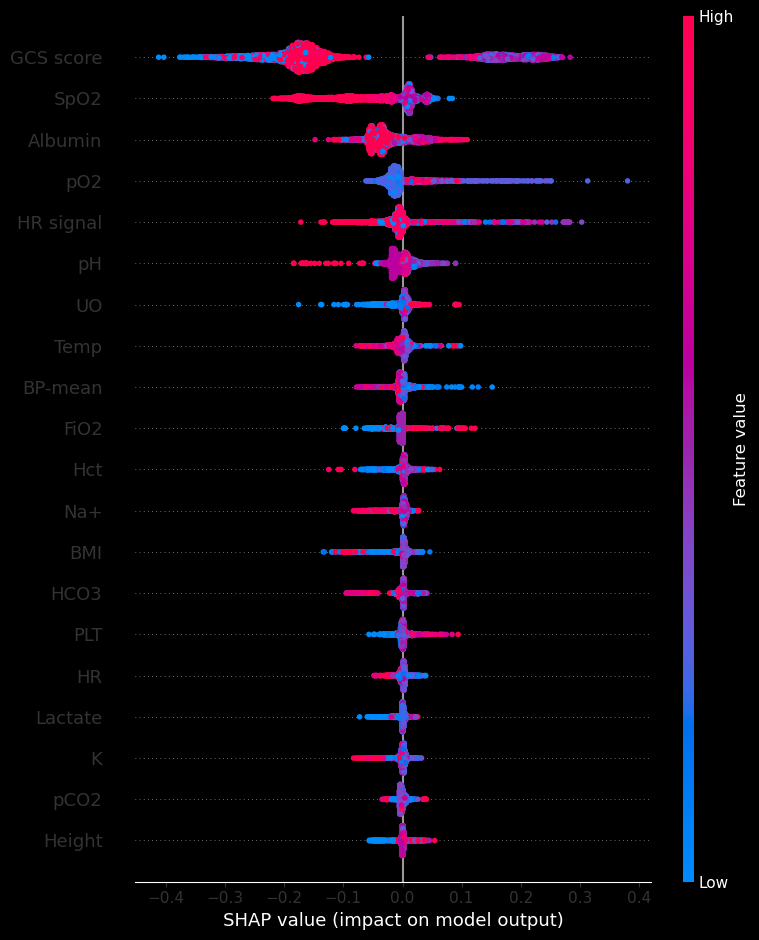

In [44]:
import shap

explainer = shap.TreeExplainer(clf.estimators_[1],)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test, feature_names=numeric_df.columns.tolist())

In [43]:
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

X_val, y_val, y_reg_val = X_test, y_test, y_reg_test
y_pred = clf.predict(X_val,)
y_reg_pred = reg.predict(X_val)
print("Test Dataset score")
print(classification_report(y_val, y_pred, labels=[0,1]))
print("ROC: ",roc_auc_score(y_val, y_pred))
print("RMSE:", mean_squared_error(y_reg_val, y_reg_pred, squared=False),"\n",
      "MAE: ", mean_absolute_error(y_reg_val, y_reg_pred,),"\n",  
      "R2: ", r2_score(y_reg_val, y_reg_pred,))

X_val, y_val = X_test[male_index], y_test[male_index]
y_pred = clf.predict(X_val,)
y_reg_pred = reg.predict(X_val)
print("Male Only Test Dataset score")
print(classification_report(y_val, y_pred, labels=[0,1]))
print("ROC: ",roc_auc_score(y_val, y_pred))
print("RMSE:", mean_squared_error(y_reg_val, y_reg_pred, squared=False),"\n",
      "MAE: ", mean_absolute_error(y_reg_val, y_reg_pred,),"\n",  
      "R2: ", r2_score(y_reg_val, y_reg_pred,))

X_val, y_val = X_test[female_index], y_test[female_index]
y_pred = clf.predict(X_val,)
y_reg_pred = reg.predict(X_val)
print("Female Only Test Dataset score")
print(classification_report(y_val, y_pred, labels=[0,1]))
print("ROC: ",roc_auc_score(y_val, y_pred))
print("RMSE:", mean_squared_error(y_reg_val, y_reg_pred, squared=False),"\n",
      "MAE: ", mean_absolute_error(y_reg_val, y_reg_pred,),"\n",  
      "R2: ", r2_score(y_reg_val, y_reg_pred,))

Test Dataset score
              precision    recall  f1-score   support

           0       0.67      0.92      0.78      4437
           1       0.32      0.08      0.13      2154

    accuracy                           0.64      6591
   macro avg       0.50      0.50      0.45      6591
weighted avg       0.56      0.64      0.56      6591

ROC:  0.4994637082572919


ValueError: Found input variables with inconsistent numbers of samples: [11511, 6591]

In [ ]:
from pytorch_tabnet.tab_model import TabNetClassifier, TabNetRegressor
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report

skf = StratifiedKFold(n_splits=3, shuffle=True, )
for train_idx, val_idx in skf.split(X, y):
    clf = TabNetClassifier(n_d=91, n_a=37,n_steps=1,gamma=1.95,
                           n_independent=1, n_shared=1, output_dim=1,
                           optimizer_params=dict(lr=1e-2), verbose=0,
                           device_name="gpu")
    reg = TabNetRegressor(n_d=91, n_a=37,n_steps=1,gamma=1.95,
                          n_independent=1, n_shared=1, output_dim=1,
                          optimizer_params=dict(lr=1e-2), verbose=0,
                          device_name="gpu")
    X_train, y_train, y_reg_train = X[train_idx], y[train_idx], y_reg[train_idx]
    X_val, y_val, y_reg_val = X[val_idx], y[val_idx], y_reg[val_idx]
    clf.fit(X_train, y_train)
    reg.fit(X_train, y_reg_train)
    y_pred = clf.predict(X_val,)
    y_reg_pred = reg.predict(X_val)
    print(classification_report(y_val, y_pred, labels=[0,1]))
    print("ROC: ",roc_auc_score(y_val, y_pred))
    print("RMSE:", mean_squared_error(y_reg_val, y_reg_pred, squared=False),
          "MAE: ", mean_absolute_error(y_reg_val, y_reg_pred,),  
          "R2: ", r2_score(y_reg_val, y_reg_pred,))



Early stopping occurred at epoch 26 with best_epoch = 16 and best_val_0_auc = 0.70626


/root/anaconda3/envs/torch_env/lib/python3.11/site-packages/pytorch_tabnet/callbacks.py:172: UserWarning: Best weights from best epoch are automatically used!
  warnings.warn(wrn_msg)


              precision    recall  f1-score   support

           0       0.67      0.61      0.64     11481
           1       0.64      0.69      0.67     11481

    accuracy                           0.65     22962
   macro avg       0.65      0.65      0.65     22962
weighted avg       0.65      0.65      0.65     22962


Early stopping occurred at epoch 24 with best_epoch = 14 and best_val_0_auc = 0.71535


/root/anaconda3/envs/torch_env/lib/python3.11/site-packages/pytorch_tabnet/callbacks.py:172: UserWarning: Best weights from best epoch are automatically used!
  warnings.warn(wrn_msg)


              precision    recall  f1-score   support

           0       0.64      0.73      0.68     11481
           1       0.68      0.58      0.63     11481

    accuracy                           0.66     22962
   macro avg       0.66      0.66      0.65     22962
weighted avg       0.66      0.66      0.65     22962


Early stopping occurred at epoch 24 with best_epoch = 14 and best_val_0_auc = 0.70662


/root/anaconda3/envs/torch_env/lib/python3.11/site-packages/pytorch_tabnet/callbacks.py:172: UserWarning: Best weights from best epoch are automatically used!
  warnings.warn(wrn_msg)


              precision    recall  f1-score   support

           0       0.66      0.64      0.65     11481
           1       0.65      0.67      0.66     11481

    accuracy                           0.65     22962
   macro avg       0.65      0.65      0.65     22962
weighted avg       0.65      0.65      0.65     22962

